<a href="https://colab.research.google.com/github/ckurtz/teaching_UPC_UFRMI/blob/main/CLIP_tutorial_(with_medical_images_ROCO).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Notebook created in 2024 with the help of Xiaoyang Wei, Phd student at LIPADE, Université Paris Cité

# Interacting with CLIP

This is a self-contained notebook that shows how to download and run CLIP models, calculate the similarity between arbitrary image and text inputs, and perform zero-shot image classifications.

# Preparation for Colab

Make sure you're running a GPU runtime; if not, select "GPU" as the hardware accelerator in Runtime > Change Runtime Type in the menu. The next cells will install the `clip` package and its dependencies, and check if PyTorch 1.7.1 or later is installed.

In [1]:
! pip install ftfy regex tqdm
! pip install git+https://github.com/openai/CLIP.git

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 3.8 MB/s eta 0:00:00
  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-pldciljv
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-pldciljv
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1369489 sha256=ab31f587fe0bb57971047cda0a84379ea672c8c7dc0c2ecf7b206c8734006821
  Stored in directory: /tmp/pip-ephem-wheel-cache-djizf3c7/wheels/da/2b/4c/d6691fa9597aac8bb85d2ac13b112deb897d5b50f5ad9a37e4
Successfully built clip


# Loading the model

`clip.available_models()` will list the names of available CLIP models.

In [2]:
import clip
import numpy as np

clip.available_models()

['RN50',
 'RN101',
 'RN50x4',
 'RN50x16',
 'RN50x64',
 'ViT-B/32',
 'ViT-B/16',
 'ViT-L/14',
 'ViT-L/14@336px']

In [3]:
model, preprocess = clip.load("ViT-B/16")
model.cuda().eval()
input_resolution = model.visual.input_resolution
context_length = model.context_length
vocab_size = model.vocab_size

print("Model parameters:", f"{np.sum([int(np.prod(p.shape)) for p in model.parameters()]):,}")
print("Input resolution:", input_resolution)
print("Context length:", context_length)
print("Vocab size:", vocab_size)

100%|███████████████████████████████████████| 335M/335M [00:04<00:00, 78.5MiB/s]


Model parameters: 149,620,737
Input resolution: 224
Context length: 77
Vocab size: 49408


# Image Preprocessing

We resize the input images and center-crop them to conform with the image resolution that the model expects. Before doing so, we will normalize the pixel intensity using the dataset mean and standard deviation.

The second return value from `clip.load()` contains a torchvision `Transform` that performs this preprocessing.



In [4]:
preprocess

Compose(
    Resize(size=224, interpolation=bicubic, max_size=None, antialias=True)
    CenterCrop(size=(224, 224))
    <function _convert_image_to_rgb at 0x7ce509a36a70>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)

# Text Preprocessing

We use a case-insensitive tokenizer, which can be invoked using `clip.tokenize()`. By default, the outputs are padded to become 77 tokens long, which is what the CLIP models expects.

In [5]:
clip.tokenize("Hello World!")

tensor([[49406,  3306,  1002,   256, 49407,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0]], dtype=torch.int32)

# Setting up input images and texts

We are going to feed 8 example natrural/medical images and their textual descriptions to the model, and compare the similarity between the corresponding features.

The tokenizer is case-insensitive, and we can freely give any suitable textual descriptions.

In [7]:
import os
import skimage
import IPython.display
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
from collections import OrderedDict
import torch

%matplotlib inline
%config InlineBackend.figure_format = 'retina'


# to mount google drive
if os.getcwd()=='/content':
    try:
        from google.colab import drive
        base_working_dir = '/content/drive/MyDrive'
        drive.mount('/content/drive')
    except:
        base_working_dir = os.getcwd()
        pass
!mkdir -p drive
!google-drive-ocamlfuse drive
print(base_working_dir)

Mounted at /content/drive
/bin/bash: line 1: google-drive-ocamlfuse: command not found
/content/drive/MyDrive


In [8]:
# images to use and their textual descriptions
descriptions = {
    "page": "a page of text about segmentation",
    "chelsea": "a facial photo of a tabby cat",
    "astronaut": "a portrait of an astronaut with the American flag",
    "rocket": "a rocket standing on a launchpad",
    "motorcycle_right": "a red motorcycle standing in a garage",
    "camera": "a person looking at a camera on a tripod",
    "horse": "a black-and-white silhouette of a horse",
    "coffee": "a cup of coffee on a saucer"
}

med_descriptions = {
    "ROCO_00002": "CT scan in axial view showing obliteration of the left maxillary sinus",
    "ROCO_00017": "Coronary angiogram demonstrating occluded arteries",
    "ROCO_00028": "T2 weighted MRI image showing foraminal extensions of the cysts",
    "ROCO_00033": "Lytic lesions (arrows) involving the humerus.",
    "ROCO_00050": "Free air beneath the diaphragm at abdominal x-ray film",
    "ROCO_00056": "View of giant cell tumor of thumb metacarpal preoperatively",
    "ROCO_00060": "Transverse view of lung using CT.Leukemic infiltration is seen.",
    "ROCO_00135": "CT scan showing multiple non-communicating cysts in liver and kidney"
}

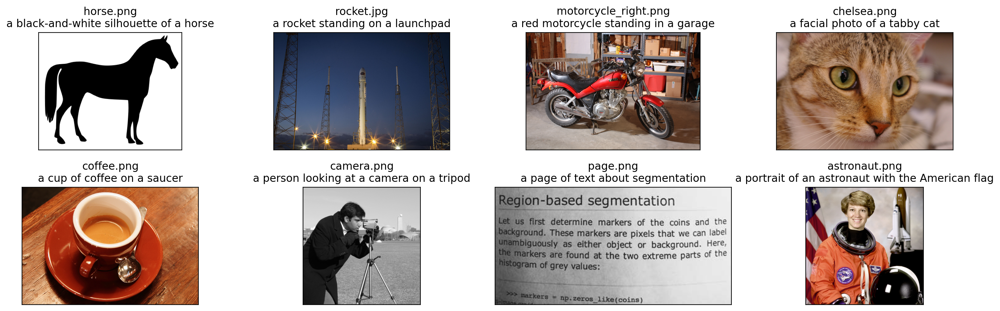

In [10]:
original_images = []
images = []
texts = []
plt.figure(figsize=(16, 5))

skimage.data.download_all(directory=None)
for filename in [filename for filename in os.listdir(skimage.data_dir) if filename.endswith(".png") or filename.endswith(".jpg")]:
    name = os.path.splitext(filename)[0]
    if name not in descriptions:
        continue

    image = Image.open(os.path.join(skimage.data_dir, filename)).convert("RGB")

    plt.subplot(2, 4, len(images) + 1)
    plt.imshow(image)
    plt.title(f"{filename}\n{descriptions[name]}")
    plt.xticks([])
    plt.yticks([])

    original_images.append(image)
    images.append(preprocess(image))
    texts.append(descriptions[name])

plt.tight_layout()


## Building features

We normalize the images, tokenize each text input, and run the forward pass of the model to get the image and text features.

In [11]:
image_input = torch.tensor(np.stack(images)).cuda()
text_tokens = clip.tokenize(["This is " + desc for desc in texts]).cuda()
with torch.no_grad():
    image_features = model.encode_image(image_input).float()
    text_features = model.encode_text(text_tokens).float()

## Calculating cosine similarity

We normalize the features and calculate the dot product of each pair.

Text(0.5, 1.0, 'Cosine similarity between text and image features(natural)')

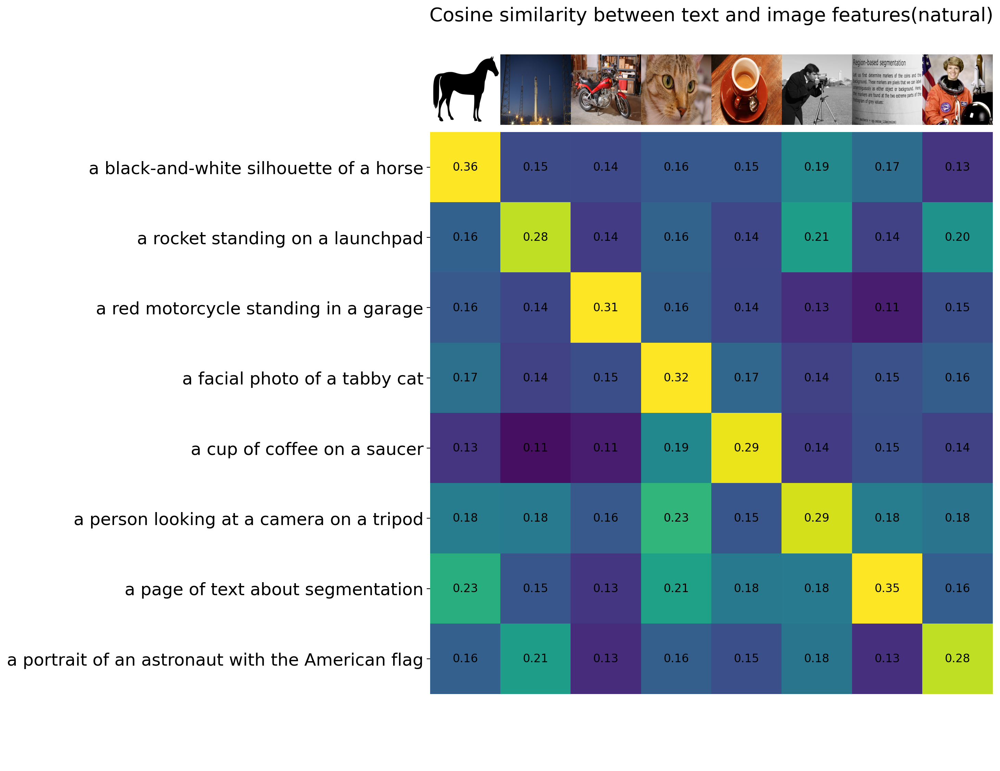

In [ ]:
image_features /= image_features.norm(dim=-1, keepdim=True)
text_features /= text_features.norm(dim=-1, keepdim=True)
similarity = text_features.cpu().numpy() @ image_features.cpu().numpy().T

count = len(descriptions)

plt.figure(figsize=(20, 14))
plt.imshow(similarity, vmin=0.1, vmax=0.3)
# plt.colorbar()
plt.yticks(range(count), texts, fontsize=18)
plt.xticks([])
for i, image in enumerate(original_images):
    plt.imshow(image, extent=(i - 0.5, i + 0.5, -1.6, -0.6), origin="lower")
for x in range(similarity.shape[1]):
    for y in range(similarity.shape[0]):
        plt.text(x, y, f"{similarity[y, x]:.2f}", ha="center", va="center", size=12)

for side in ["left", "top", "right", "bottom"]:
  plt.gca().spines[side].set_visible(False)

plt.xlim([-0.5, count - 0.5])
plt.ylim([count + 0.5, -2])

plt.title("Cosine similarity between text and image features(natural)", size=20)

## Performance of CLIP in medical domain

Text(0.5, 1.0, 'Cosine similarity between text and image features(medical)')

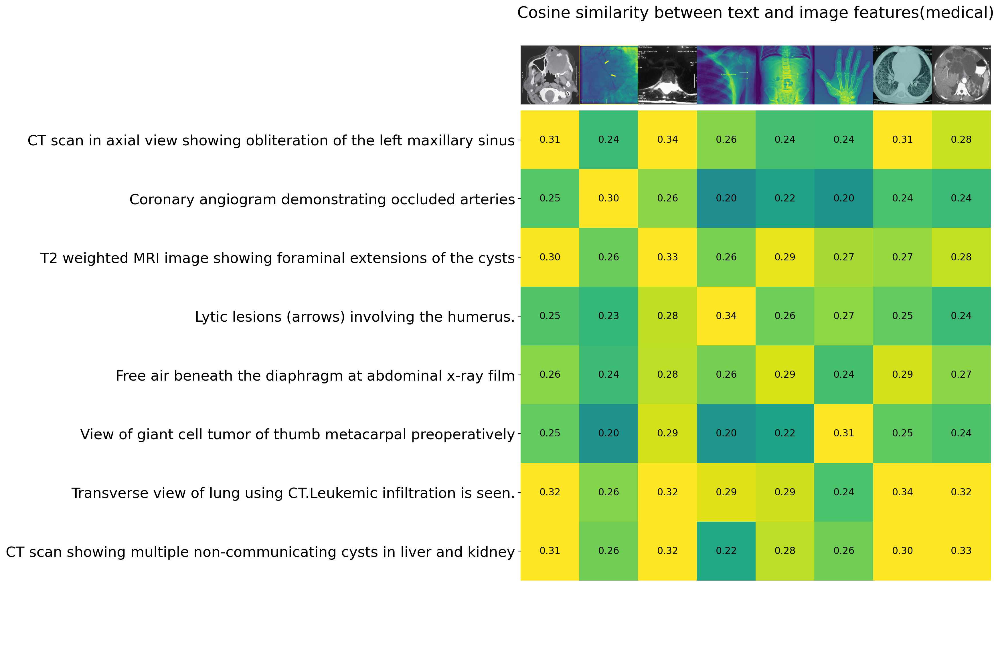

In [ ]:
original_images = []
images = []
texts = []
for filename in list(med_descriptions.keys()):
    image = Image.open(os.path.join("/content/drive/My Drive/data/pretrain_data/roco/train/radiology/images", filename+'.jpg'))
    original_images.append(image)
    images.append(preprocess(image))
    texts.append(med_descriptions[filename])
image_input = torch.tensor(np.stack(images)).cuda()
text_tokens = clip.tokenize(["This is " + desc for desc in texts]).cuda()
with torch.no_grad():
    image_features = model.encode_image(image_input).float()
    text_features = model.encode_text(text_tokens).float()
image_features /= image_features.norm(dim=-1, keepdim=True)
text_features /= text_features.norm(dim=-1, keepdim=True)
similarity = text_features.cpu().numpy() @ image_features.cpu().numpy().T

count = len(descriptions)

plt.figure(figsize=(20, 14))
plt.imshow(similarity, vmin=0.1, vmax=0.3)
# plt.colorbar()
plt.yticks(range(count), texts, fontsize=18)
plt.xticks([])
for i, image in enumerate(original_images):
    plt.imshow(image, extent=(i - 0.5, i + 0.5, -1.6, -0.6), origin="lower")
for x in range(similarity.shape[1]):
    for y in range(similarity.shape[0]):
        plt.text(x, y, f"{similarity[y, x]:.2f}", ha="center", va="center", size=12)
for side in ["left", "top", "right", "bottom"]:
  plt.gca().spines[side].set_visible(False)

plt.xlim([-0.5, count - 0.5])
plt.ylim([count + 0.5, -2])

plt.title("Cosine similarity between text and image features(medical)", size=20)


# Zero-Shot Image Classification

You can classify images using the cosine similarity (times 100) as the logits to the softmax operation.

In [ ]:
from torchvision.datasets import CIFAR100

cifar100 = CIFAR100(os.path.expanduser("~/.cache"), transform=preprocess, download=True)

100%|██████████| 169M/169M [00:12<00:00, 13.4MB/s]


Extracting /root/.cache/cifar-100-python.tar.gz to /root/.cache


In [ ]:
text_descriptions = [f"This is a photo of a {label}" for label in cifar100.classes]
text_tokens = clip.tokenize(text_descriptions).cuda()

In [ ]:
with torch.no_grad():
    text_features = model.encode_text(text_tokens).float()
    text_features /= text_features.norm(dim=-1, keepdim=True)

text_probs = (100.0 * image_features @ text_features.T).softmax(dim=-1)
top_probs, top_labels = text_probs.cpu().topk(5, dim=-1)

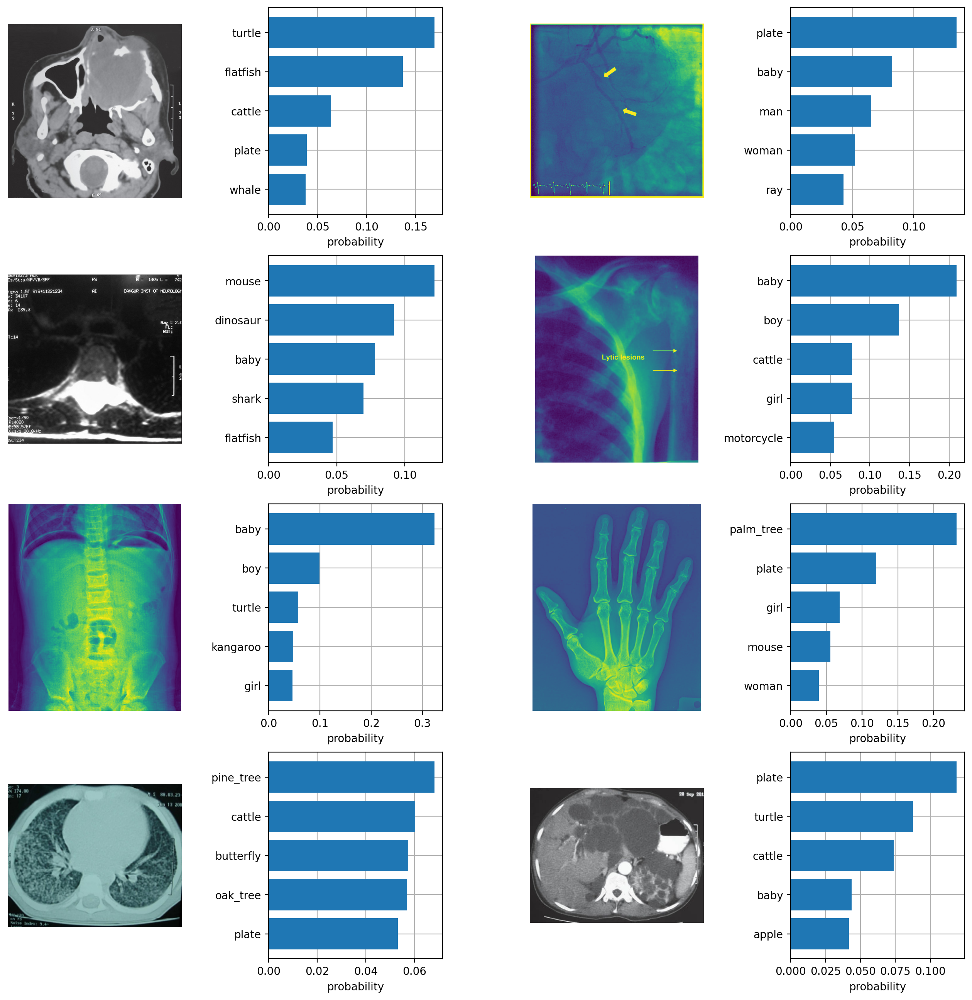

In [ ]:
plt.figure(figsize=(16, 16))

for i, image in enumerate(original_images):
    plt.subplot(4, 4, 2 * i + 1)
    plt.imshow(image)
    plt.axis("off")

    plt.subplot(4, 4, 2 * i + 2)
    y = np.arange(top_probs.shape[-1])
    plt.grid()
    plt.barh(y, top_probs[i])
    plt.gca().invert_yaxis()
    plt.gca().set_axisbelow(True)
    plt.yticks(y, [cifar100.classes[index] for index in top_labels[i].numpy()])
    plt.xlabel("probability")

plt.subplots_adjust(wspace=0.5)
plt.show()

# Fine-tuning CLIP on ROCO



In [ ]:
# dataset location
csv_file ="/content/drive/My Drive/data/roco-list.csv"
root_dir = "/content/drive/My Drive/data/pretrain_data/roco/train/radiology/images"
val_csv_file = "/content/drive/My Drive/data/local-val-list.csv"
val_root_dir = "/content/drive/My Drive/data/pretrain_data/roco/val/radiology/images"

# train options
seed = 42
batch_size = 16
image_size = 224
start_epoch = 0
epochs = 10
visual_encoder = "clip@ViT-B/16"
learning_rate = 3e-6
model_path = "/content/drive/My Drive/model_checkpoint_CLIP_ROCO" # set to the directory containing `checkpoint_##.tar`


In [ ]:
import os
import numpy as np
import pandas as pd
import torch
import torchvision
import datetime
import time
from tqdm import tqdm
from PIL import Image, ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True
from torch.utils.data import Dataset
import random
import clip



class CLRDataset(Dataset):
    """Contrastive Learning Representations Dataset."""

    def __init__(self, csv_file, root_dir, transform=None, clip=False):
        self.clr_frame = pd.read_csv(csv_file)
        self.root_dir = root_dir
        self.transform = transform
        self.clip = clip

    def __len__(self):
        return len(self.clr_frame)

    def text_sampling(self, text):
        text = text.replace("\n", " ")
        text = text.split(".")
        if '' in text:
            text.remove('')
        text = random.choice(text)
        return text

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        img_name = os.path.join(self.root_dir,
                                self.clr_frame.iloc[idx, 0]
                                )
        if not os.path.exists(img_name):
            img_name=img_name.replace('train','val')
        image = Image.open(img_name)
        if not self.clip:
            image = image.convert('RGB')
        text = self.clr_frame.iloc[idx, 1]
        name = self.clr_frame.iloc[idx, 0]
        sample = {'image': image, 'text': text,'name':name}
        if self.clip:
            sample = self.transform(sample['image']), sample['text'],sample['name'] #self.text_sampling(sample['text'])
        elif self.transform:
            sample = self.transform(sample)

        return sample


def load_optimizer( model, lr=3e-6):
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
        optimizer, epochs, eta_min=0, last_epoch=-1
    )
    return optimizer, scheduler


def train( train_loader, model, tokenizer, optimizer,truncation):
    loss_epoch = 0
    for step, (images, texts,name) in enumerate(train_loader):
        optimizer.zero_grad()
        x_v = images.to('cuda')
        x_u = tokenizer(list(texts), truncate=True).to('cuda')

        v,u=model(x_v,x_u)

        labels = torch.arange(batch_size, dtype=torch.long, device='cuda')

        loss_img = torch.nn.CrossEntropyLoss()
        loss_txt = torch.nn.CrossEntropyLoss()

        img_loss = loss_img(v,labels)
        text_loss = loss_txt(u,labels)

        loss = (img_loss + text_loss)/2

        loss.backward()
        optimizer.step()

        if step % 500 == 0:
            print(f"Step [{step}/{len(train_loader)}]\t Loss: {loss.item()}")

        loss_epoch += loss.item()
    return loss_epoch



def validate( val_loader, model, tokenizer, optimizer, truncation):

    with torch.no_grad():
        model.eval()
        loss_epoch = 0
        for step, (x_v, x_u) in enumerate(val_loader):
            x_v = x_v.to('cuda')
            x_u = tokenizer(list(x_u), truncate=True).to('cuda')

            v,u=model(x_v,x_u)

            labels = torch.arange(batch_size, dtype=torch.long, device='cuda')

            loss_img = torch.nn.CrossEntropyLoss()
            loss_txt = torch.nn.CrossEntropyLoss()

            img_loss = loss_img(v,labels)
            text_loss = loss_txt(u,labels)

            loss = (img_loss + text_loss)/2
            loss_epoch += loss.item()

    model.train()
    return loss_epoch


def main(gpu):

    is_master=True

    # set GPU device
    torch.cuda.set_device(gpu)
    torch.manual_seed(seed)
    np.random.seed(seed)

    # initialize model
    print("Initializing model... ", end="", flush=True)
    model, preprocess = clip.load(visual_encoder.split("@")[-1], device='cuda', jit=False)
    model.float()
    tokenizer=clip.tokenize
    train_fonction = train
    validate_fonction = validate

    # optimizer
    optimizer, scheduler = load_optimizer(model, lr=float(learning_rate))

    # initialize dataloader
    transform = preprocess
    print('Image_Transform',transform)
    train_dataset = CLRDataset(csv_file=csv_file,
                               root_dir=root_dir,
                               transform=transform,
                               clip = True
                               )

    val_dataset = CLRDataset(csv_file=val_csv_file,
                             root_dir=val_root_dir,
                             transform=transform,
                             clip = True
                             )

    train_sampler = None
    train_loader = torch.utils.data.DataLoader(
        train_dataset,
        batch_size=batch_size,
        shuffle=(train_sampler is None),
        drop_last=True,
        num_workers=8,
        sampler=train_sampler,
    )

    val_loader = torch.utils.data.DataLoader(
        val_dataset,
        batch_size=batch_size,
        drop_last=True,
        num_workers=8
    )

    print("[DONE]\n")
    print("STARTING TRAINING")
    print('Start Time =', datetime.datetime.now().strftime("%H:%M:%S"), '\n')

    t0 = time.time()
    global_step = 0
    current_epoch = 0
    best_val_loss = np.inf

    for epoch in range(0, epochs):
        if epoch<2:
            if train_sampler is not None:
                train_sampler.set_epoch(epoch)

            lr = optimizer.param_groups[0]["lr"]
            loss_epoch = train_fonction(train_loader, model, tokenizer, optimizer,True)

        if is_master:
            val_loss = validate_fonction( val_loader, model, tokenizer, optimizer, True)
            if val_loss < best_val_loss:
                torch.save(model.state_dict(), os.path.join(model_path, "best_checkpoint.pth"))
                best_val_loss = val_loss

            epoch_counter = epoch - 0
            elapsed = time.time() - t0
            epoch_time = elapsed/(epoch_counter+1)
            remaining = (epochs - (epoch_counter+1))*epoch_time
            remaining = str(datetime.timedelta(seconds=round(remaining)))
            elapsed = str(datetime.timedelta(seconds=round(elapsed)))
            print(f'Epoch {epoch_counter+1}/{epochs} [{elapsed}<{remaining}, {round(epoch_time, 2)}s/epoch] {round((epoch_counter+1)/epochs*100, 1)}% loss: {loss_epoch / len(train_loader)}\t val_loss: {val_loss / len(val_loader)} lr: {lr}')

            current_epoch += 1


if not os.path.exists(model_path):
    os.makedirs(model_path)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Device:", device)
main(0)

Device: cuda:0
Initializing model... Image_Transform Compose(
    Resize(size=224, interpolation=bicubic, max_size=None, antialias=True)
    CenterCrop(size=(224, 224))
    <function _convert_image_to_rgb at 0x7b284582bf40>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)
[DONE]

STARTING TRAINING
Start Time = 17:45:00 



/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Step [0/4087]	 Loss: 1.6037722826004028


KeyboardInterrupt: 

## Performance of CLIP in medical domain(after fine-tuning on ROCO )

<ipython-input-18-7cae9f99fa92>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('/content/drive/My Drive/data/ViT-B-16_best_checkpoint_2.ta

Text(0.5, 1.0, 'Cosine similarity between text and image features(medical)')

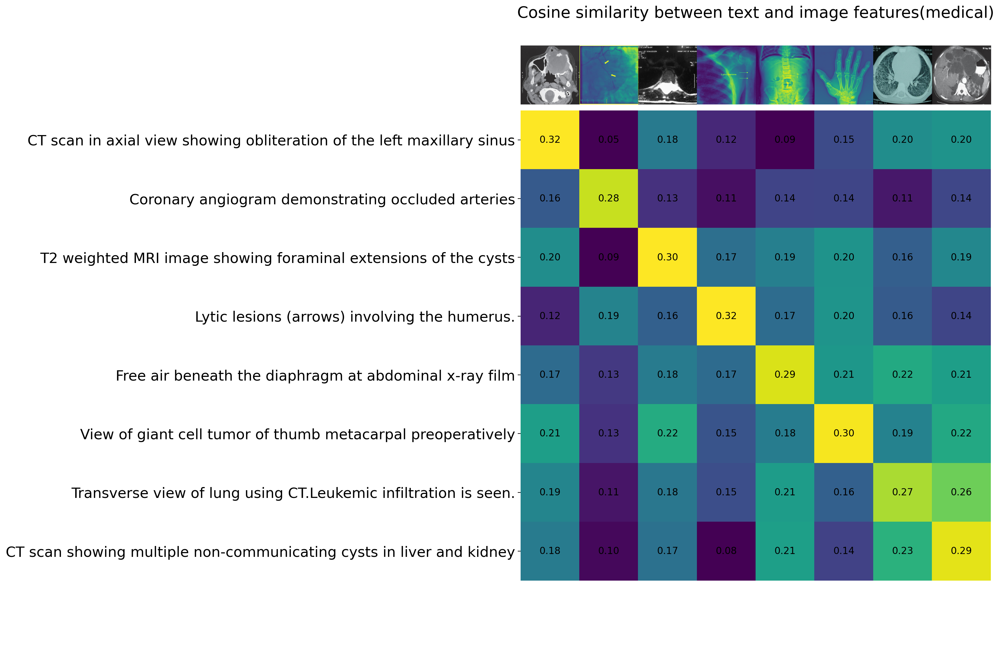

In [ ]:
#load checkpoint
model.load_state_dict(torch.load('/content/drive/My Drive/data/ViT-B-16_best_checkpoint_2.tar'))

#compute txt-img similarity again
original_images = []
images = []
texts = []
for filename in list(med_descriptions.keys()):
    image = Image.open(os.path.join(root_dir, filename+'.jpg'))
    original_images.append(image)
    images.append(preprocess(image))
    texts.append(med_descriptions[filename])
image_input = torch.tensor(np.stack(images)).cuda()
text_tokens = clip.tokenize(["This is " + desc for desc in texts]).cuda()
with torch.no_grad():
    image_features = model.encode_image(image_input).float()
    text_features = model.encode_text(text_tokens).float()
image_features /= image_features.norm(dim=-1, keepdim=True)
text_features /= text_features.norm(dim=-1, keepdim=True)
similarity = text_features.cpu().numpy() @ image_features.cpu().numpy().T

count = len(descriptions)

plt.figure(figsize=(20, 14))
plt.imshow(similarity, vmin=0.1, vmax=0.3)
plt.yticks(range(count), texts, fontsize=18)
plt.xticks([])
for i, image in enumerate(original_images):
    plt.imshow(image, extent=(i - 0.5, i + 0.5, -1.6, -0.6), origin="lower")
for x in range(similarity.shape[1]):
    for y in range(similarity.shape[0]):
        plt.text(x, y, f"{similarity[y, x]:.2f}", ha="center", va="center", size=12)

for side in ["left", "top", "right", "bottom"]:
  plt.gca().spines[side].set_visible(False)

plt.xlim([-0.5, count - 0.5])
plt.ylim([count + 0.5, -2])

plt.title("Cosine similarity between text and image features(medical)", size=20)

# 2)

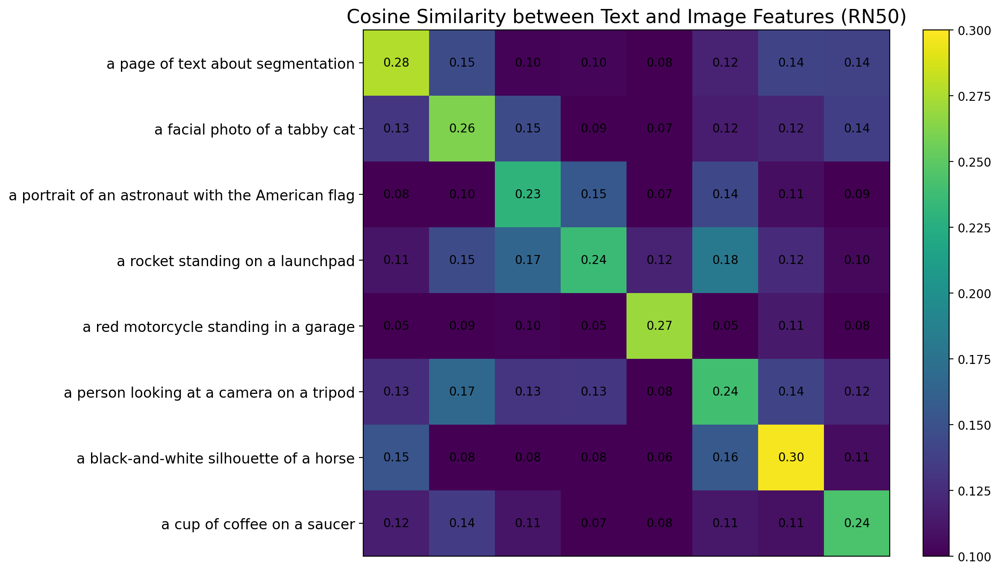

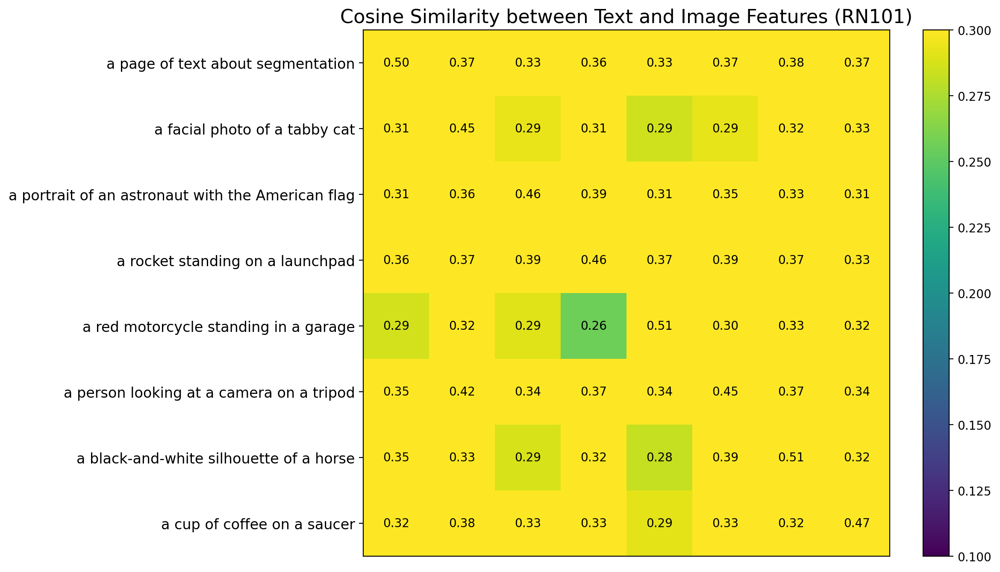

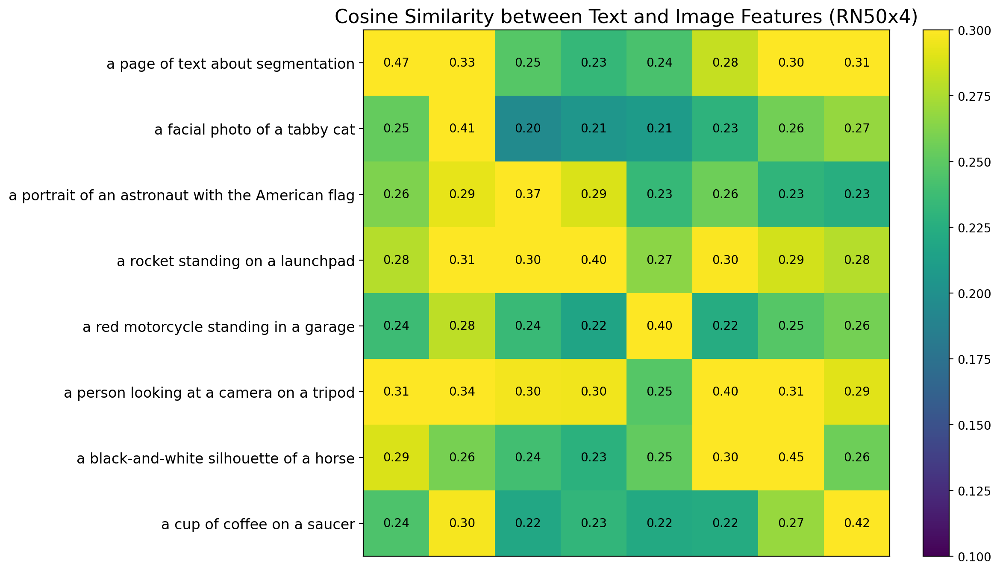

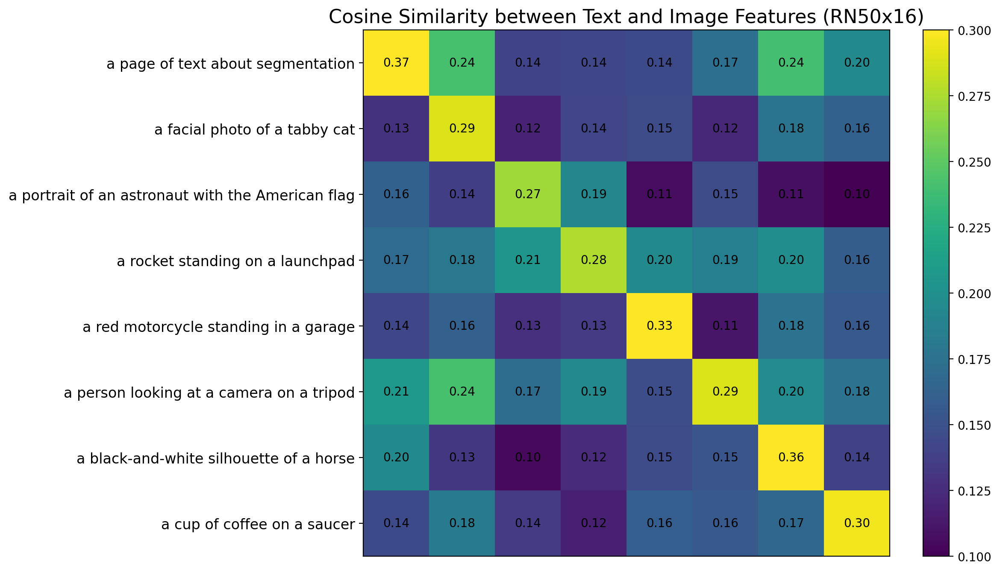

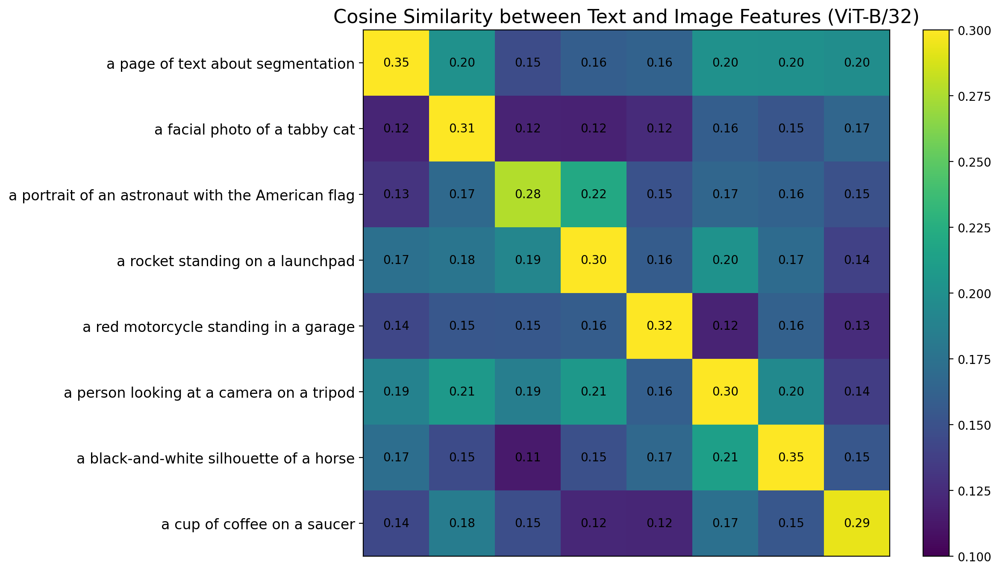

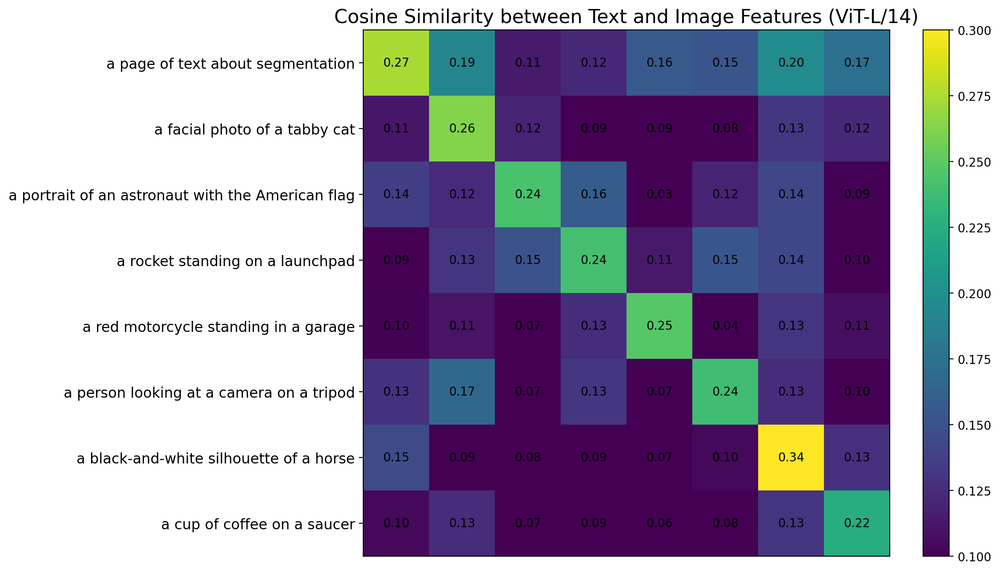

In [12]:
import clip
import torch
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import os
import skimage.data

# Load the models
models = {
    "RN50": clip.load("RN50", device='cuda'),
    "RN101": clip.load("RN101", device='cuda'),
    "RN50x4": clip.load("RN50x4", device='cuda'),
    "RN50x16": clip.load("RN50x16", device='cuda'),
    "ViT-B/32": clip.load("ViT-B/32", device='cuda'),
    "ViT-L/14": clip.load("ViT-L/14", device='cuda')
}

# Define image and text descriptions
image_filenames = ["page", "chelsea", "astronaut", "rocket", "motorcycle_right", "camera", "horse", "coffee"]
descriptions = {
    "page": "a page of text about segmentation",
    "chelsea": "a facial photo of a tabby cat",
    "astronaut": "a portrait of an astronaut with the American flag",
    "rocket": "a rocket standing on a launchpad",
    "motorcycle_right": "a red motorcycle standing in a garage",
    "camera": "a person looking at a camera on a tripod",
    "horse": "a black-and-white silhouette of a horse",
    "coffee": "a cup of coffee on a saucer"
}

# Preprocess images and texts
images = {model_name: [] for model_name in models.keys()}
texts = []

for filename in image_filenames:
    # Construct paths for both PNG and JPG
    png_path = os.path.join(skimage.data_dir, filename + '.png')
    jpg_path = os.path.join(skimage.data_dir, filename + '.jpg')

    # Check if the PNG file exists, if not, check for the JPG file
    if os.path.exists(png_path):
        image_path = png_path
    elif os.path.exists(jpg_path):
        image_path = jpg_path
    else:
        print(f"Image file for {filename} not found in either format.")
        continue  # Skip this iteration if neither file exists

    # Open the image and process it
    image = Image.open(image_path).convert("RGB")

    for model_name, (_, preprocess) in models.items():
        images[model_name].append(preprocess(image))
    texts.append(descriptions[filename])

# Convert to tensors
image_inputs = {model_name: torch.tensor(np.stack(images[model_name])).cuda() for model_name in models.keys()}
text_tokens = clip.tokenize(["This is " + desc for desc in texts]).cuda()

# Calculate features and similarities for each model
similarities = {}

for model_name, (model, _) in models.items():
    with torch.no_grad():
        image_features = model.encode_image(image_inputs[model_name]).float()
        text_features = model.encode_text(text_tokens).float()

    # Normalize the features
    image_features /= image_features.norm(dim=-1, keepdim=True)
    text_features /= text_features.norm(dim=-1, keepdim=True)

    # Calculate cosine similarity
    similarities[model_name] = text_features.cpu().numpy() @ image_features.cpu().numpy().T

# Visualize the similarity matrices
def plot_similarity(similarity, model_name):
    plt.figure(figsize=(10, 8))
    plt.imshow(similarity, vmin=0.1, vmax=0.3)
    plt.yticks(range(len(descriptions)), texts, fontsize=12)
    plt.xticks([])
    for x in range(similarity.shape[1]):
        for y in range(similarity.shape[0]):
            plt.text(x, y, f"{similarity[y, x]:.2f}", ha="center", va="center", size=10)
    plt.title(f"Cosine Similarity between Text and Image Features ({model_name})", size=16)
    plt.colorbar()
    plt.show()

# Plot similarities for all models
for model_name in models.keys():
    plot_similarity(similarities[model_name], model_name)


In [13]:
# Function to calculate accuracy
def calculate_accuracy(similarity, texts):
    correct_predictions = 0
    total = len(texts)

    # For each text description, find the index of the image with the highest similarity
    for i, text in enumerate(texts):
        predicted_index = np.argmax(similarity[i])
        # Check if the predicted index corresponds to the correct description
        if predicted_index == i:
            correct_predictions += 1

    accuracy = (correct_predictions / total) * 100
    return accuracy

# Calculate accuracy for each model
accuracies = {}
for model_name in models.keys():
    accuracies[model_name] = calculate_accuracy(similarities[model_name], texts)

# Print out the accuracy results
for model_name, accuracy in accuracies.items():
    print(f"Accuracy for {model_name}: {accuracy:.2f}%")


Accuracy for RN50: 100.00%
Accuracy for RN101: 100.00%
Accuracy for RN50x4: 100.00%
Accuracy for RN50x16: 100.00%
Accuracy for ViT-B/32: 100.00%
Accuracy for ViT-L/14: 100.00%


# 3)

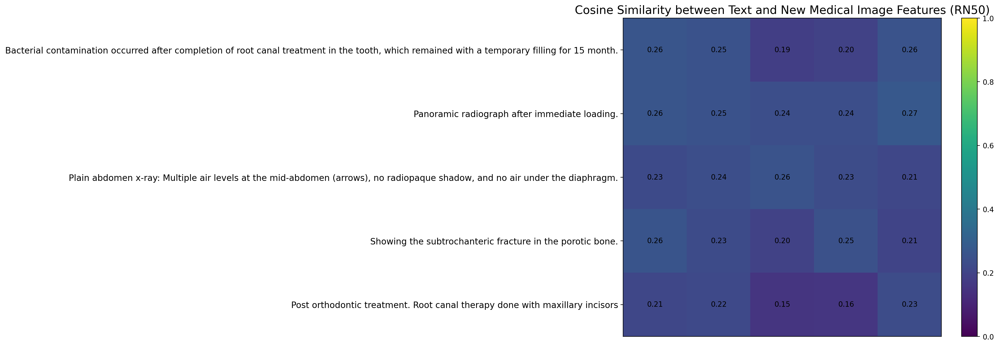

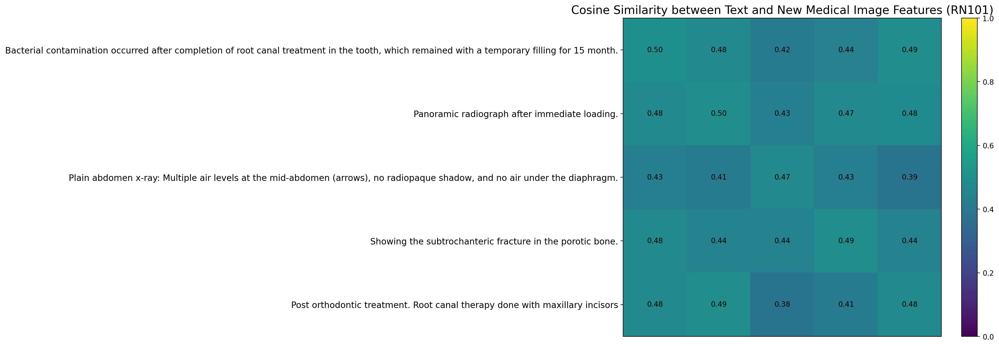

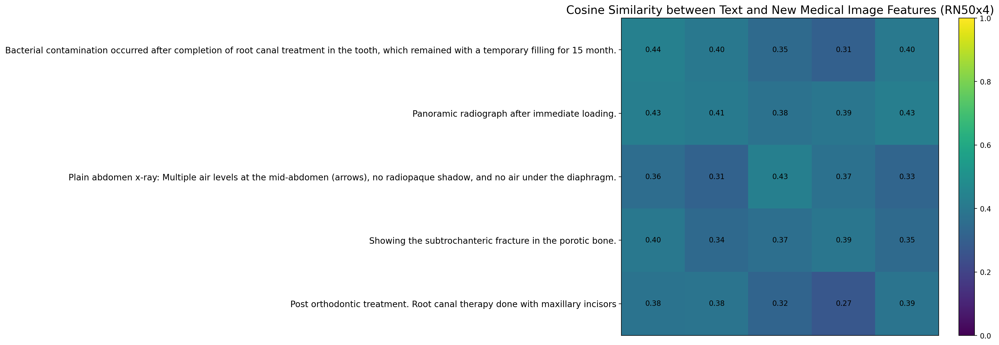

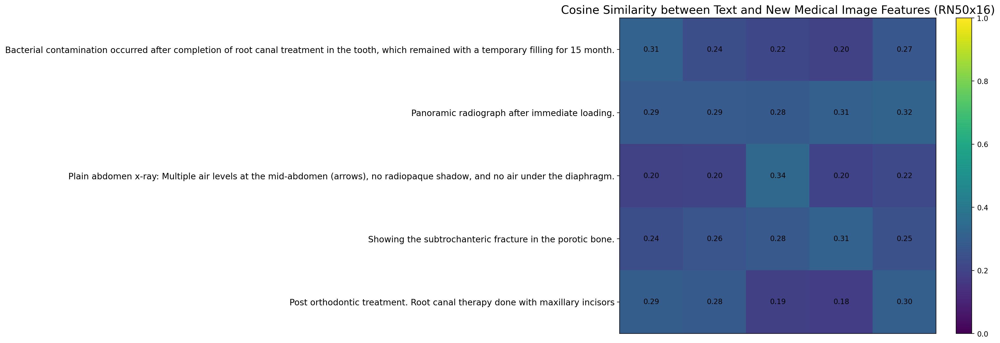

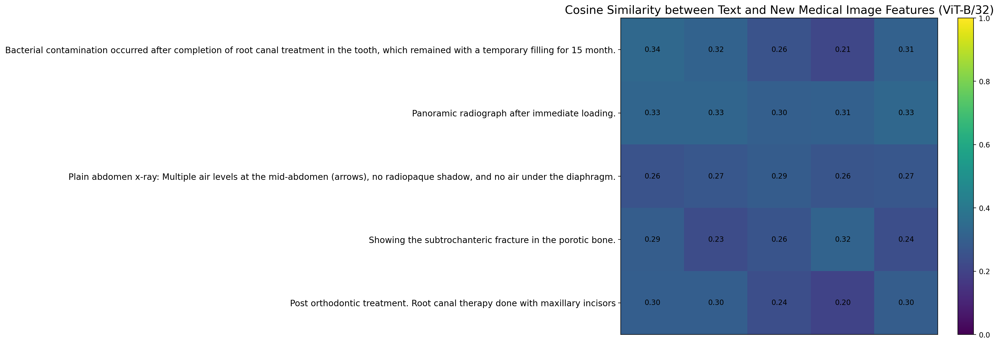

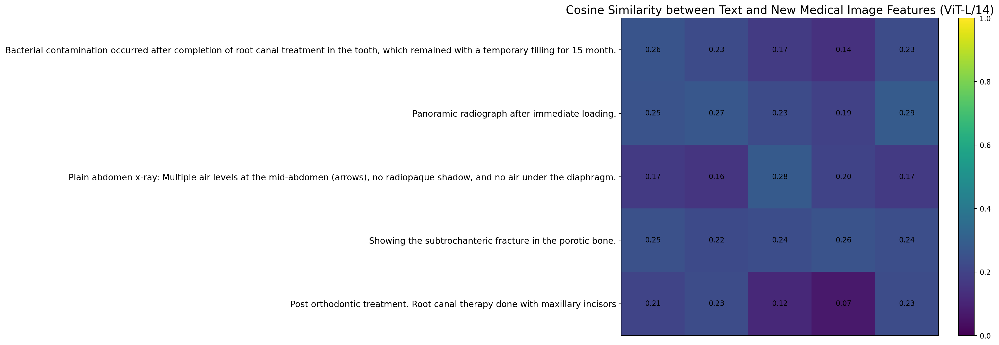

Accuracy for RN50 on new medical images: 60.00%
Accuracy for RN101 on new medical images: 80.00%
Accuracy for RN50x4 on new medical images: 60.00%
Accuracy for RN50x16 on new medical images: 80.00%
Accuracy for ViT-B/32 on new medical images: 60.00%
Accuracy for ViT-L/14 on new medical images: 60.00%


In [21]:
new_med_descriptions = {
    "ROCO_00003.jpg": "Bacterial contamination occurred after completion of root canal treatment in the tooth, which remained with a temporary filling for 15 month.",
    "ROCO_00005.jpg": "Panoramic radiograph after immediate loading.",
    "ROCO_00007.jpg": "Plain abdomen x-ray: Multiple air levels at the mid-abdomen (arrows), no radiopaque shadow, and no air under the diaphragm.",
    "ROCO_00009.jpg": "Showing the subtrochanteric fracture in the porotic bone.",
    "ROCO_00010.jpg": "Post orthodontic treatment. Root canal therapy done with maxillary incisors",

}


# Preprocess the new medical images and texts for all models
images_new = {model_name: [] for model_name in models.keys()}
texts_new = []

for filename in new_med_descriptions.keys():
    # Open the image
    image_path = os.path.join("/content/drive/My Drive/data/pretrain_data/roco/train/radiology/images", filename)
    image = Image.open(image_path).convert("RGB")

    for model_name, (_, preprocess) in models.items():
        images_new[model_name].append(preprocess(image))
    texts_new.append(new_med_descriptions[filename])

# Convert to tensors for each model
image_inputs_new = {model_name: torch.tensor(np.stack(images_new[model_name])).cuda() for model_name in models.keys()}
text_tokens_new = clip.tokenize(["This is " + desc for desc in texts_new]).cuda()

# Calculate features and similarities for each model
similarities_new = {}

for model_name, (model, _) in models.items():
    with torch.no_grad():
        image_features_new = model.encode_image(image_inputs_new[model_name]).float()
        text_features_new = model.encode_text(text_tokens_new).float()

    # Normalize the features
    image_features_new /= image_features_new.norm(dim=-1, keepdim=True)
    text_features_new /= text_features_new.norm(dim=-1, keepdim=True)

    # Calculate cosine similarity
    similarities_new[model_name] = text_features_new.cpu().numpy() @ image_features_new.cpu().numpy().T

# Visualize the similarity matrices for new medical images
def plot_similarity(similarity, model_name):
    plt.figure(figsize=(10, 8))
    plt.imshow(similarity, vmin=0.0, vmax=1.0)
    plt.yticks(range(len(new_med_descriptions)), list(new_med_descriptions.values()), fontsize=12)
    plt.xticks([])
    for x in range(similarity.shape[1]):
        for y in range(similarity.shape[0]):
            plt.text(x, y, f"{similarity[y, x]:.2f}", ha="center", va="center", size=10)
    plt.title(f"Cosine Similarity between Text and New Medical Image Features ({model_name})", size=16)
    plt.colorbar()
    plt.show()

# Plot similarities for all models
for model_name in models.keys():
    plot_similarity(similarities_new[model_name], model_name)

# Calculate accuracy for the new medical images
def calculate_accuracy(similarity, texts):
    correct_predictions = 0
    total = len(texts)

    # For each text description, find the index of the image with the highest similarity
    for i, text in enumerate(texts):
        predicted_index = np.argmax(similarity[i])
        # Check if the predicted index corresponds to the correct description
        if predicted_index == i:
            correct_predictions += 1

    accuracy = (correct_predictions / total) * 100
    return accuracy

# Calculate accuracy for each model on new medical images
accuracies_new = {}
for model_name in models.keys():
    accuracies_new[model_name] = calculate_accuracy(similarities_new[model_name], texts_new)

# Print out the accuracy results for new medical images
for model_name, accuracy in accuracies_new.items():
    print(f"Accuracy for {model_name} on new medical images: {accuracy:.2f}%")


# 4)

In [23]:
# Install necessary packages
!pip install ftfy regex tqdm
!pip install git+https://github.com/openai/CLIP.git

import torch
import clip
import torchvision.transforms as transforms
from torchvision.datasets import STL10
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image


  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-kvkniotg
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-kvkniotg
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done


In [24]:
# Load the STL10 dataset
def load_stl10(data_dir):
    dataset = STL10(root=data_dir, split='train', download=True, transform=transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ]))
    return dataset

data_dir = './data'  # Specify your data directory
stl10_dataset = load_stl10(data_dir)


100%|██████████| 2.64G/2.64G [01:08<00:00, 38.4MB/s]


Extracting ./data/stl10_binary.tar.gz to ./data


In [25]:
# Load CLIP models
device = "cuda" if torch.cuda.is_available() else "cpu"
model_rn50, preprocess_rn50 = clip.load("RN50", device=device)
model_vitb32, preprocess_vitb32 = clip.load("ViT-B/32", device=device)


In [26]:
# Define text descriptions for the classes in STL10 dataset
stl10_classes = ['airplane', 'bird', 'car', 'cat', 'deer', 'dog', 'horse', 'monkey', 'frog', 'ship']
text_descriptions = [f"This is a photo of a {label}" for label in stl10_classes]
text_tokens = clip.tokenize(text_descriptions).to(device)


In [59]:
import torch.nn.functional as F

def evaluate(model, dataset, text_tokens, device):
    model.eval()
    all_logits = []
    all_labels = []
    with torch.no_grad():
        for images, labels in dataset:
            images = images.to(device)
            image_features = model.encode_image(images)
            text_features = model.encode_text(text_tokens)

            # Normalize the features
            image_features /= image_features.norm(dim=-1, keepdim=True)
            text_features /= text_features.norm(dim=-1, keepdim=True)

            # Calculate similarity
            logits = (100.0 * image_features @ text_features.T).softmax(dim=-1)
            all_logits.append(logits)
            all_labels.append(labels)

    return torch.cat(all_logits), torch.cat(all_labels)


In [58]:
import torchvision.transforms.functional as F
import matplotlib.pyplot as plt
import torch

def visualize_examples(model, dataset, text_tokens, device, num_examples=5):
    model.eval()
    plt.figure(figsize=(15, num_examples * 3))
    with torch.no_grad():
        for i, (image, label) in enumerate(dataset):
            if i >= num_examples:
                break

            # Move image to device for model processing
            image_for_model = image.unsqueeze(0).to(device)
            image_features = model.encode_image(image_for_model)
            text_features = model.encode_text(text_tokens)

            # Normalize features
            image_features /= image_features.norm(dim=-1, keepdim=True)
            text_features /= text_features.norm(dim=-1, keepdim=True)

            # Calculate similarity
            logits = (100.0 * image_features @ text_features.T).softmax(dim=-1)
            predicted_label = logits.argmax(dim=-1).item()
            predicted_class = stl10_classes[predicted_label]

            # Convert the original image to numpy array with shape (height, width, channels)
            original_image = image.permute(1, 2, 0).cpu().numpy()  # Change shape from (C, H, W) to (H, W, C)

            # Display the original image with predicted and actual labels
            plt.subplot(num_examples, 1, i + 1)
            plt.imshow(original_image)
            plt.title(f"Actual: {stl10_classes[label]}\nPredicted: {predicted_class}")
            plt.axis('off')

    plt.show()



In [51]:
device = "cuda" if torch.cuda.is_available() else "cpu"
models = {
    "RN50": clip.load("RN50", device=device),
    "RN101": clip.load("RN101", device=device),
    "RN50x4": clip.load("RN50x4", device=device),
    "RN50x16": clip.load("RN50x16", device=device),
    "ViT-B/32": clip.load("ViT-B/32", device=device),
    "ViT-L/14": clip.load("ViT-L/14", device=device)
}


In [55]:
model_rn50, preprocess_rn50 = clip.load("RN50", device=device)
model_rn101, preprocess_rn101 = clip.load("RN101", device=device)
model_vitb32, preprocess_vitb32 = clip.load("ViT-B/32", device=device)
model_vitb14, preprocess_vitb14 = clip.load("ViT-L/14", device=device)

In [56]:
# Evaluate RN50
test_loader = torch.utils.data.DataLoader(stl10_dataset, batch_size=32, shuffle=False)
logits, labels = evaluate(model_rn50, test_loader, text_tokens, device)
accuracy = (logits.argmax(dim=-1) == labels.to(device)).float().mean().item()
print(f"RN50 Test Accuracy: {accuracy:.4f}")

# Evaluate RN101
test_loader = torch.utils.data.DataLoader(stl10_dataset, batch_size=32, shuffle=False)
logits, labels = evaluate(model_rn101, test_loader, text_tokens, device)
accuracy = (logits.argmax(dim=-1) == labels.to(device)).float().mean().item()
print(f"RN101 Test Accuracy: {accuracy:.4f}")

# Evaluate ViT-B/32
logits, labels = evaluate(model_vitb32, test_loader, text_tokens, device)
accuracy = (logits.argmax(dim=-1) == labels.to(device)).float().mean().item()
print(f"ViT-B/32 Test Accuracy: {accuracy:.4f}")

# Evaluate ViT-B/14
logits, labels = evaluate(model_vitb14, test_loader, text_tokens, device)
accuracy = (logits.argmax(dim=-1) == labels.to(device)).float().mean().item()
print(f"ViT-B/14 Test Accuracy: {accuracy:.4f}")

RN50 Test Accuracy: 0.7326
RN50 Test Accuracy: 0.7634
ViT-B/32 Test Accuracy: 0.7722
ViT-B/32 Test Accuracy: 0.7972


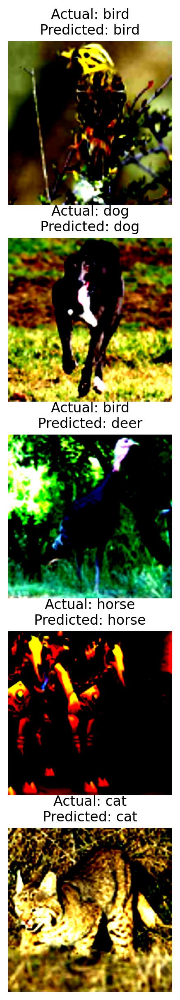

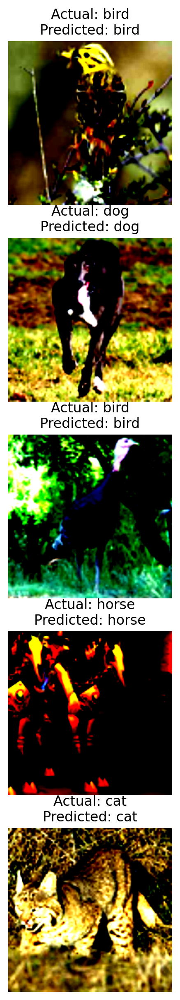

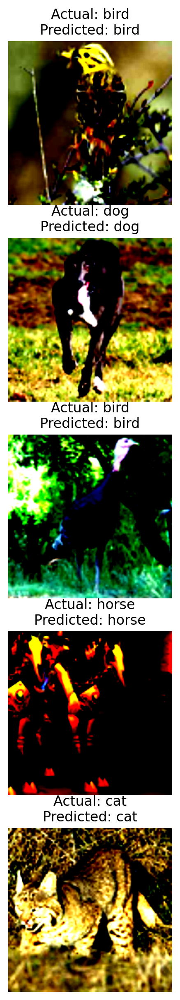

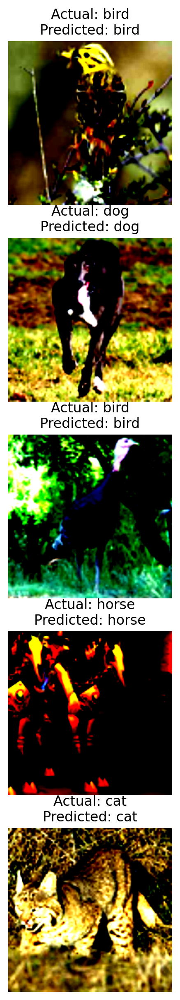

In [57]:
visualize_examples(model_rn50, stl10_dataset, text_tokens, device)
visualize_examples(model_rn101, stl10_dataset, text_tokens, device)
visualize_examples(model_vitb32, stl10_dataset, text_tokens, device)
visualize_examples(model_vitb14, stl10_dataset, text_tokens, device)